In [1]:
from collections import defaultdict
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
import seaborn as sns
import scvelo as scv
#import velocyto as vcy
from os import listdir
from os.path import isfile, join
import glob
from collections import Counter
import loompy as lp
import numba
import llvmlite

# import mnnpy
from matplotlib import colors

In [2]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
sc.settings.set_figure_params(dpi=80)
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.5 umap==0.4.6 numpy==1.19.2 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [4]:
print(numba.__version__)
print(llvmlite.__version__)
print(sc.__version__)

0.51.2
0.34.0
1.7.1


In [5]:
scv.set_figure_params('scanpy')  # for beautified visualization

## Fetal Retina day59

In [7]:
FD59 = sc.read_10x_mtx("../count_matrix/GSE142526/D59_fetal_filtered_gene_bc_matrices/GRCh38")


--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [8]:
FD59.obs['batch']='FD59'

In [9]:
sc.pp.filter_cells(FD59, min_genes=500)
sc.pp.filter_genes(FD59, min_cells=3)

print(FD59.n_obs, FD59.n_vars)

filtered out 11 cells that have less than 500 genes expressed
filtered out 16567 genes that are detected in less than 3 cells


3324 17127


In [10]:
sc.pp.calculate_qc_metrics(FD59, inplace=True)

In [11]:
mito_genes = FD59.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
FD59.obs['percent_mito'] = np.sum(
    FD59[:, mito_genes].X, axis=1).A1 / np.sum(FD59.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
FD59.obs['n_counts'] = FD59.X.sum(axis=1).A1

... storing 'batch' as categorical


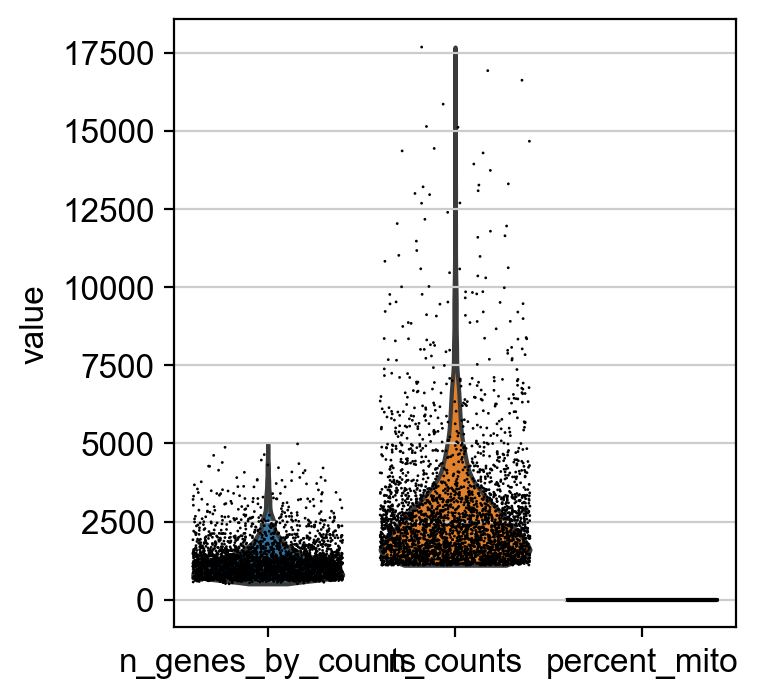

In [12]:
sc.pl.violin(FD59, ['n_genes_by_counts', 'n_counts', 'percent_mito'],
             jitter=0.4)

In [13]:
FD59 = FD59[FD59.obs['n_genes_by_counts'] < 3000, :]

FD59 = FD59[FD59.obs['n_counts'] < 7000, :]


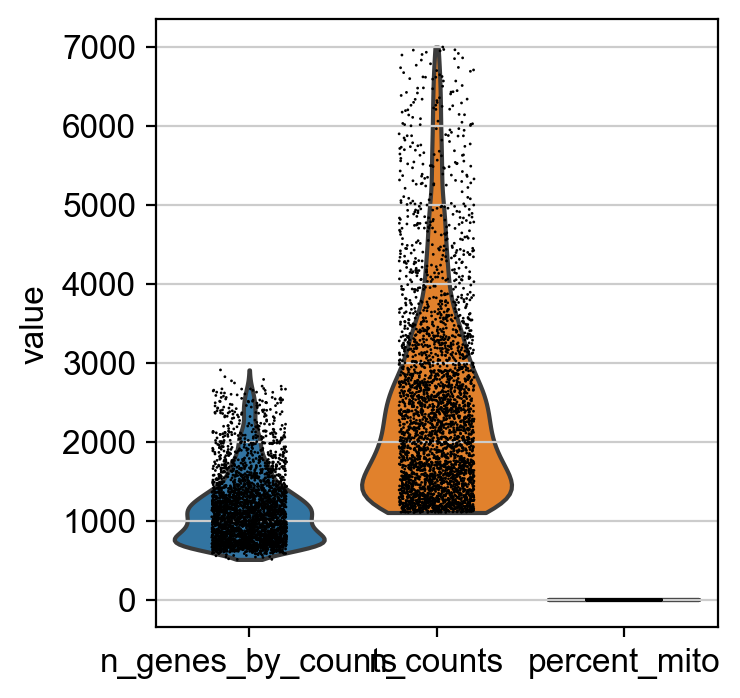

In [14]:
sc.pl.violin(FD59, ['n_genes_by_counts', 'n_counts', 'percent_mito'],
             jitter=0.2)

In [15]:
# normalize to depth 10 000
sc.pp.normalize_per_cell(FD59, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(FD59)

normalizing by total count per cell
Trying to set attribute `.obs` of view, copying.
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [16]:
sc.pp.regress_out(FD59, [ 'n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:18)


In [17]:
sc.pp.scale(FD59, max_value=10)

In [18]:
sc.tl.pca(FD59, svd_solver='arpack', n_comps=50,
#           use_highly_variable=True
         )

computing PCA
    with n_comps=50
    finished (0:00:12)


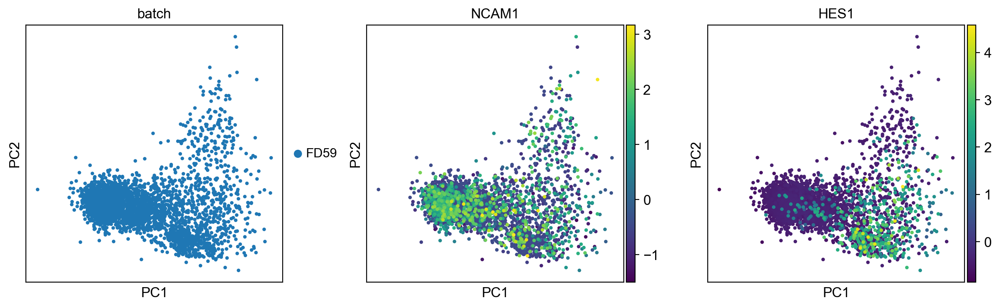

In [19]:
sc.pl.pca(FD59, color=['batch', 'NCAM1','HES1'])

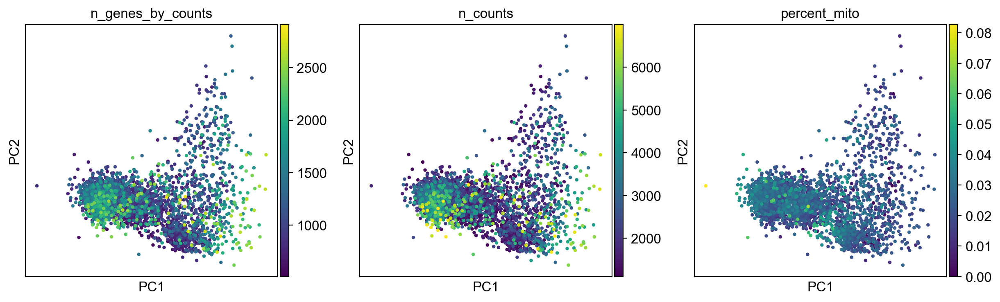

In [20]:
sc.pl.pca(FD59, color=['n_genes_by_counts', 'n_counts', 'percent_mito'])

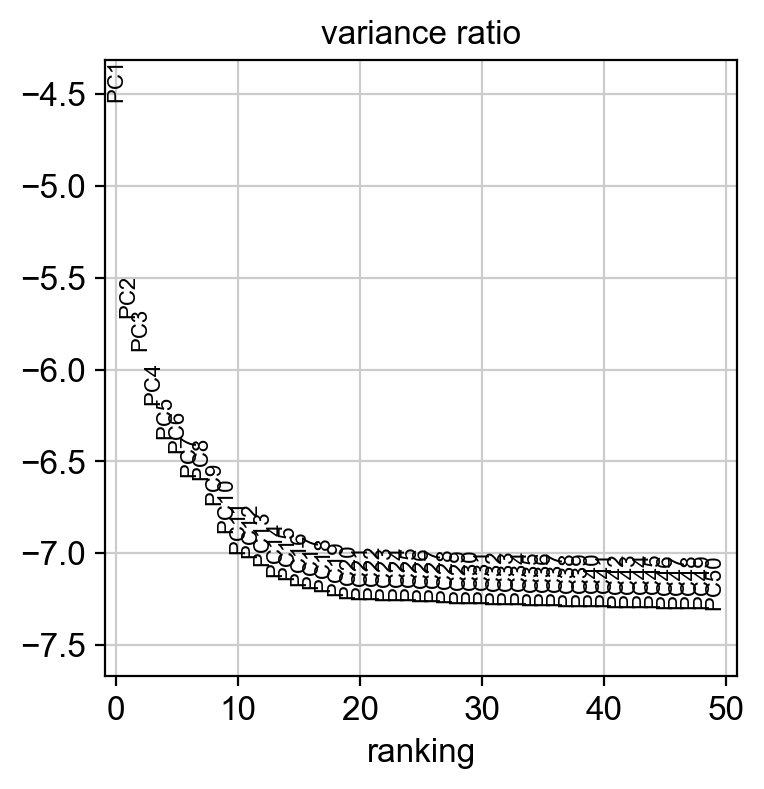

In [21]:
sc.pl.pca_variance_ratio(FD59, log=True, n_pcs = 50)

In [22]:
sc.pp.neighbors(FD59, n_neighbors=20, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [23]:
sc.tl.leiden(FD59,resolution=0.5)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [24]:
sc.tl.umap(FD59,
#            min_dist = 0.4,
#            spread = 1.0
          )

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


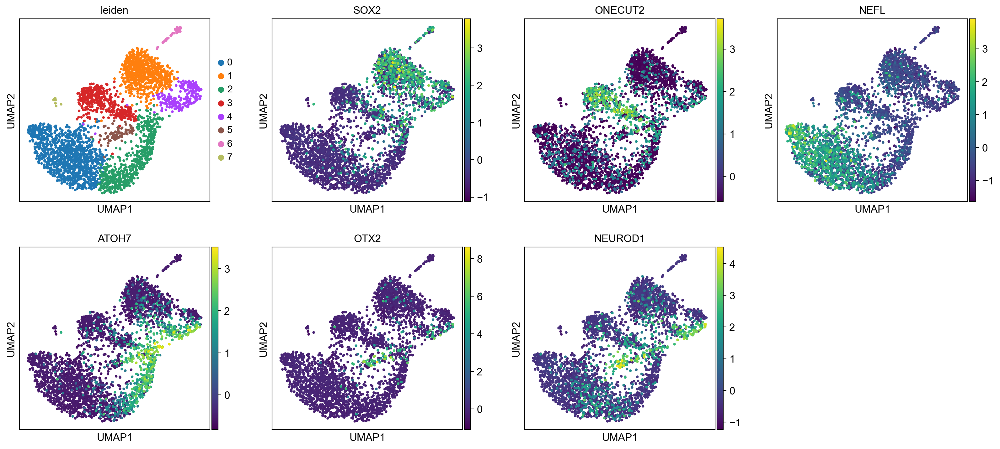

In [25]:
sc.pl.umap(FD59, color=['leiden', 'SOX2','ONECUT2','NEFL','ATOH7','OTX2','NEUROD1'])

In [26]:
keep_cells=FD59.obs["leiden"].str.contains(('^0$|^1$|^2$|^3$|^4$|^5$'), regex=True)

In [27]:
FD59 = FD59[keep_cells,:]

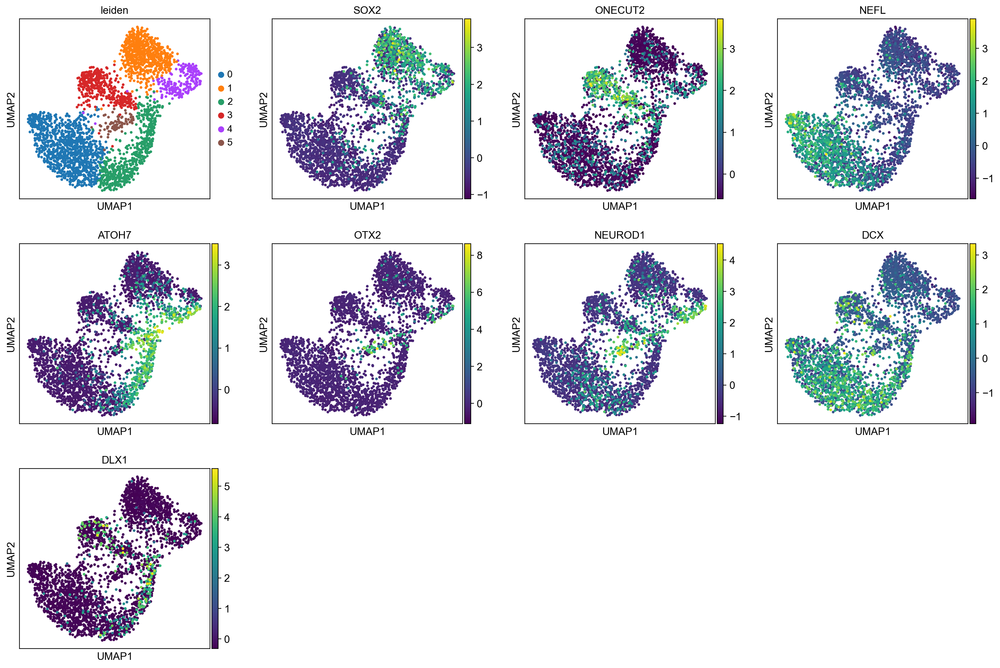

In [30]:
sc.pl.umap(FD59, color=['leiden', 'SOX2','ONECUT2','NEFL','ATOH7','OTX2','NEUROD1','DCX','DLX1'])

In [31]:
 # Rename Louvain clusters with ATOH1, ETV2 and NKX3-1
new_cluster_names = ['RGC',
                     'Prog',
                     'T1', 
                     'AC/HC-T2', 
                     'CC',
                     'T3/PR', # 5  
                    
                    ]
FD59.rename_categories('leiden', new_cluster_names)

In [32]:
FD59.write_h5ad("../count_matrix/GSE142526/D59_fetal_filtered_gene_bc_matrices/FD59_final.h5ad")

In [54]:
# FD59 = sc.read_h5ad("./FD59_final.h5ad")

## Organoid d45

In [34]:
ORGD45 = sc.read_10x_mtx("../count_matrix/GSE142526/ORG_D45_filtered_feature_bc_matrix/")


--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [35]:
ORGD45.obs['batch']='ORGD45'

In [36]:
sc.pp.filter_cells(ORGD45, min_genes=500)
sc.pp.filter_genes(ORGD45, min_cells=3)

print(ORGD45.n_obs, ORGD45.n_vars)

filtered out 311 cells that have less than 500 genes expressed
filtered out 15619 genes that are detected in less than 3 cells


1939 17119


In [37]:
sc.pp.calculate_qc_metrics(ORGD45, inplace=True)

In [38]:
mito_genes = ORGD45.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
ORGD45.obs['percent_mito'] = np.sum(
    ORGD45[:, mito_genes].X, axis=1).A1 / np.sum(ORGD45.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
ORGD45.obs['n_counts'] = ORGD45.X.sum(axis=1).A1

... storing 'batch' as categorical
... storing 'feature_types' as categorical


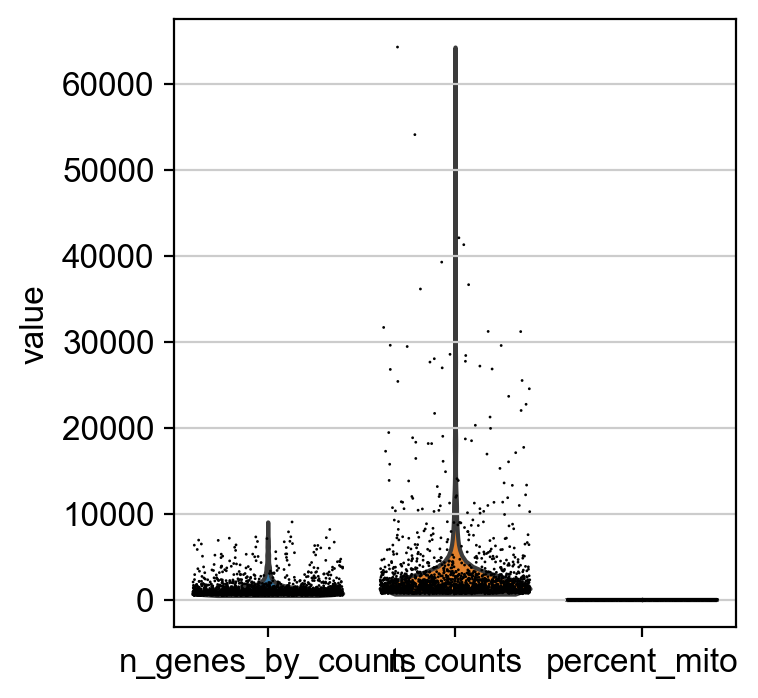

In [39]:
sc.pl.violin(ORGD45, ['n_genes_by_counts', 'n_counts', 'percent_mito'],
             jitter=0.4)

In [40]:
ORGD45 = ORGD45[ORGD45.obs['n_genes_by_counts'] < 3000, :]

ORGD45 = ORGD45[ORGD45.obs['n_counts'] < 7000, :]


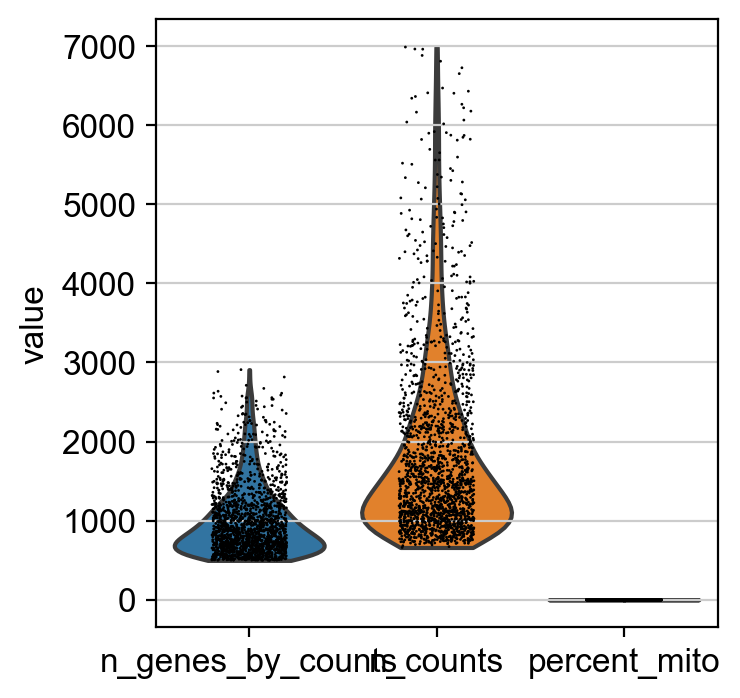

In [41]:
sc.pl.violin(ORGD45, ['n_genes_by_counts', 'n_counts', 'percent_mito'],
             jitter=0.2)

In [42]:
# normalize to depth 10 000
sc.pp.normalize_per_cell(ORGD45, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(ORGD45)

normalizing by total count per cell
Trying to set attribute `.obs` of view, copying.
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [43]:
sc.pp.regress_out(ORGD45, [ 'n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:01:47)


In [44]:
sc.pp.scale(ORGD45, max_value=10)

In [45]:
sc.tl.pca(ORGD45, svd_solver='arpack', n_comps=50,
#           use_highly_variable=True
         )

computing PCA
    with n_comps=50
    finished (0:00:07)


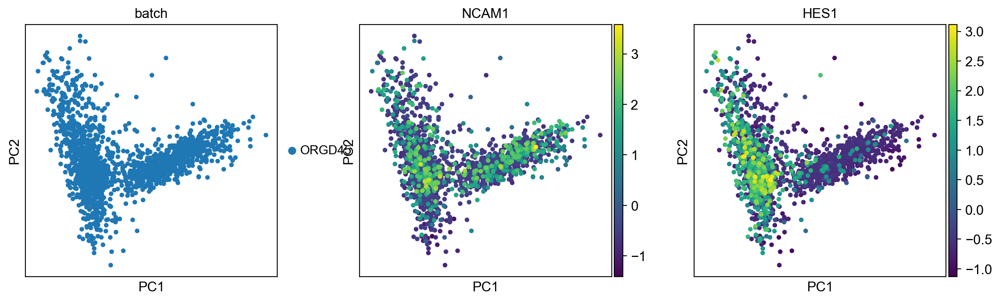

In [46]:
sc.pl.pca(ORGD45, color=['batch', 'NCAM1','HES1'])

In [47]:
sc.pp.neighbors(ORGD45, n_neighbors=20, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [48]:
sc.tl.leiden(ORGD45,resolution=0.5)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [49]:
sc.tl.umap(ORGD45,
#            min_dist = 0.4,
#            spread = 1.0
          )

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


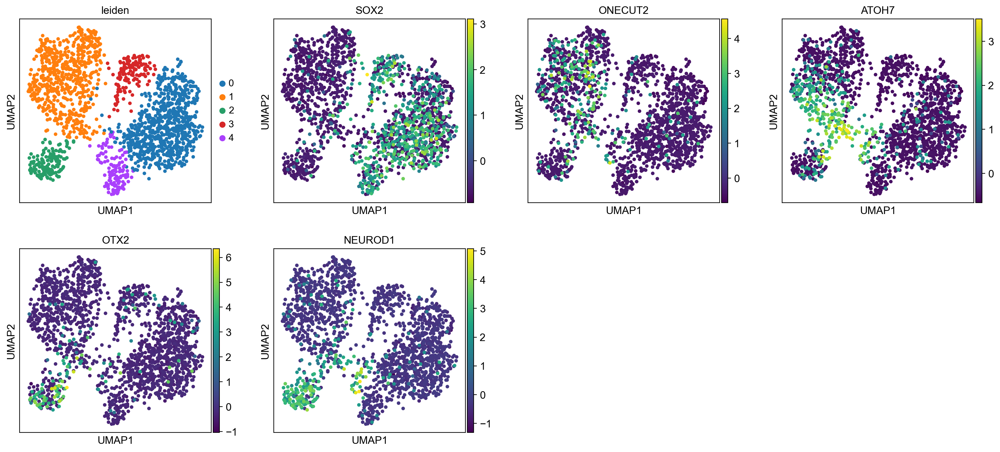

In [50]:
sc.pl.umap(ORGD45, color=['leiden', 'SOX2','ONECUT2','ATOH7','OTX2','NEUROD1'])

In [51]:
keep_cells=ORGD45.obs["leiden"].str.contains(('^0$|^1$|^2$|^3$|^4$|^5$'), regex=True)

In [52]:
ORGD45 = ORGD45[keep_cells,:]

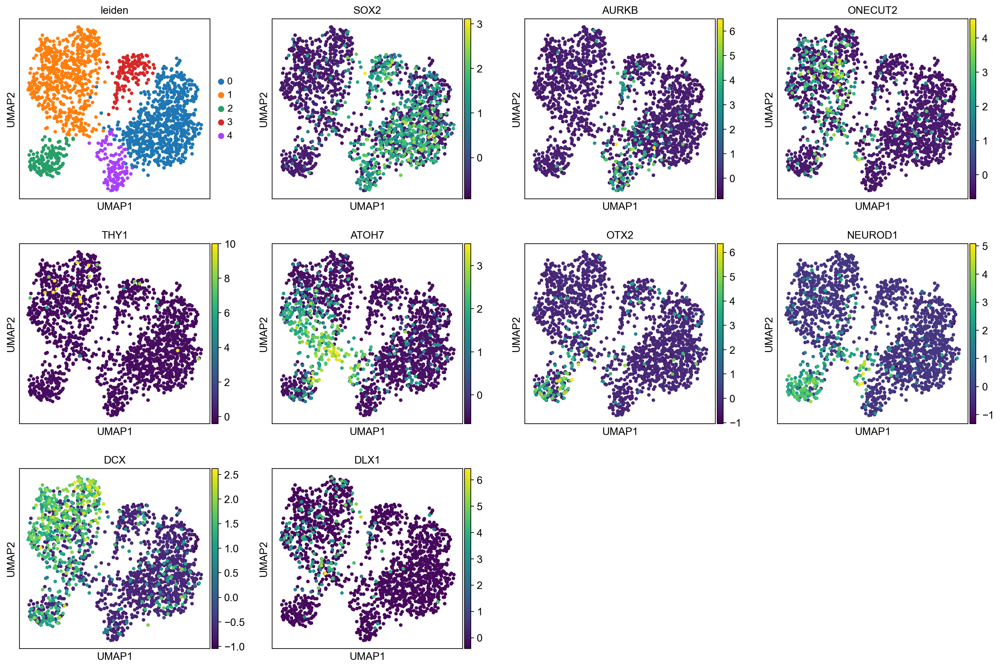

In [53]:
sc.pl.umap(ORGD45, color=['leiden', 'SOX2','AURKB','ONECUT2','THY1','ATOH7','OTX2','NEUROD1','DCX','DLX1'])

In [54]:
 # Rename Louvain clusters with ATOH1, ETV2 and NKX3-1
new_cluster_names = ['Prog_O45',
                     'AC/HC/RGC_O45',
                     'PR_O45', 
                     'Prog1_O45', 
                     'CC'
                    ]
ORGD45.rename_categories('leiden', new_cluster_names)

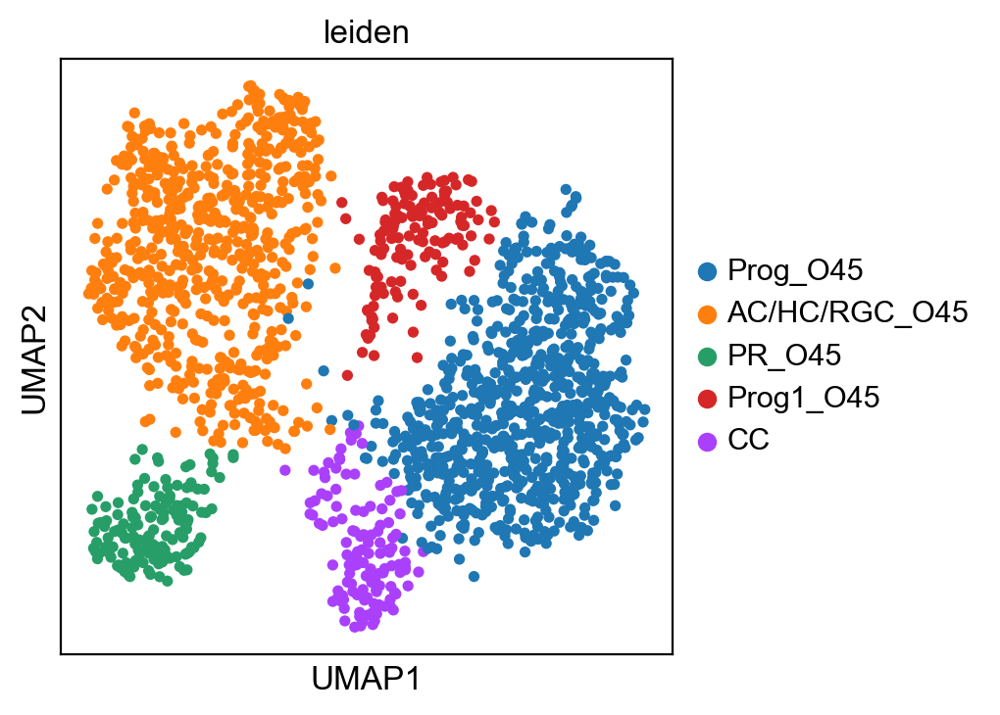

In [55]:
sc.pl.umap(ORGD45, color=['leiden'])

In [56]:
ORGD45.write_h5ad("../count_matrix/GSE142526/ORG_D45_filtered_feature_bc_matrix/ORGD45_final.h5ad")

## Organoid d60

In [57]:

ORGD60 = sc.read_10x_mtx("../count_matrix/GSE142526/ORG_D60b_filtered_feature_bc_matrix/GRCh38/")


--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [58]:
ORGD60.obs['batch']='ORGD60'

In [59]:
sc.pp.filter_cells(ORGD60, min_genes=500)
sc.pp.filter_genes(ORGD60, min_cells=3)

print(ORGD60.n_obs, ORGD60.n_vars)

filtered out 5 cells that have less than 500 genes expressed
filtered out 14791 genes that are detected in less than 3 cells


2991 18903


In [60]:
sc.pp.calculate_qc_metrics(ORGD60, inplace=True)

In [61]:
mito_genes = ORGD60.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
ORGD60.obs['percent_mito'] = np.sum(
    ORGD60[:, mito_genes].X, axis=1).A1 / np.sum(ORGD60.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
ORGD60.obs['n_counts'] = ORGD60.X.sum(axis=1).A1

... storing 'batch' as categorical


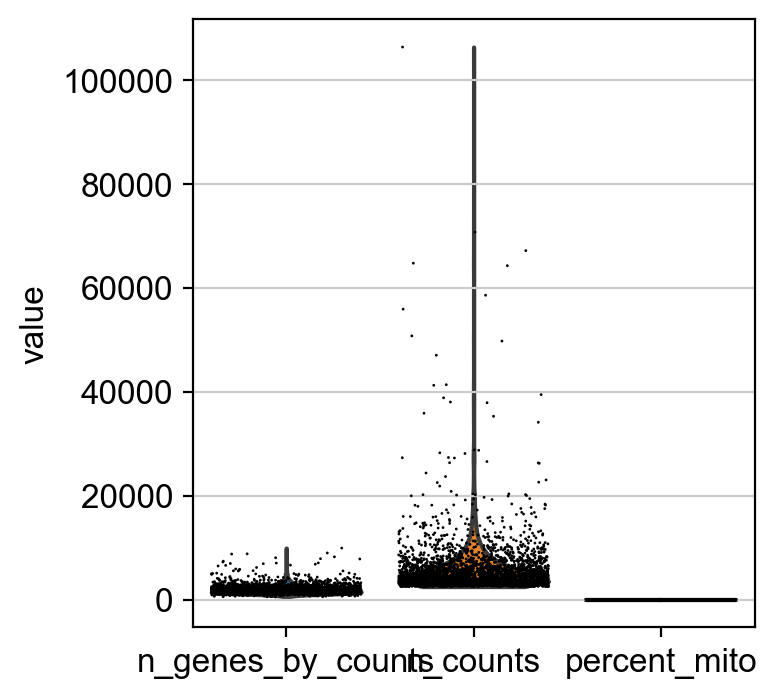

In [62]:
sc.pl.violin(ORGD60, ['n_genes_by_counts', 'n_counts', 'percent_mito'],
             jitter=0.4)

In [63]:
ORGD60 = ORGD60[ORGD60.obs['n_genes_by_counts'] < 3000, :]

ORGD60 = ORGD60[ORGD60.obs['n_counts'] < 9000, :]


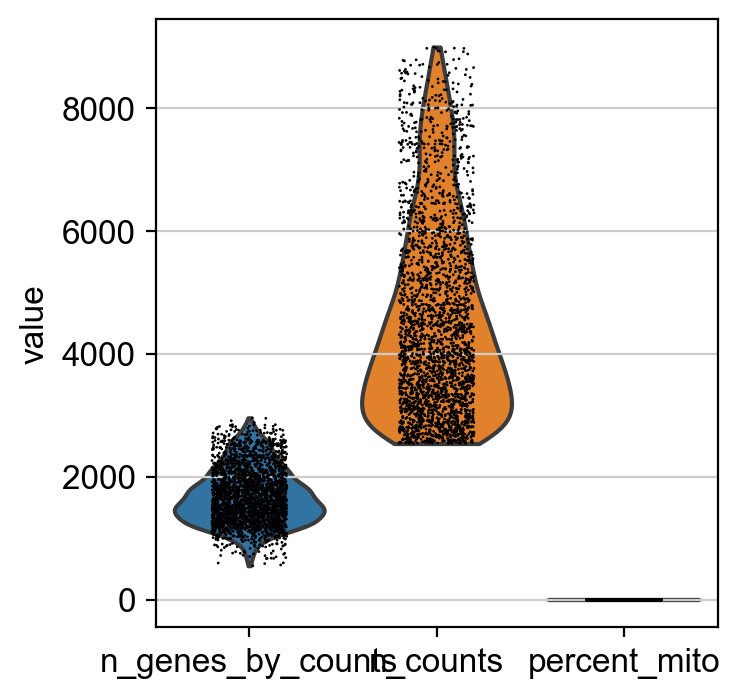

In [64]:
sc.pl.violin(ORGD60, ['n_genes_by_counts', 'n_counts', 'percent_mito'],
             jitter=0.2)

In [65]:
# normalize to depth 10 000
sc.pp.normalize_per_cell(ORGD60, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(ORGD60)

normalizing by total count per cell
Trying to set attribute `.obs` of view, copying.
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [66]:
sc.pp.regress_out(ORGD60, [ 'n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:27)


In [67]:
sc.pp.scale(ORGD60, max_value=10)

In [68]:
sc.tl.pca(ORGD60, svd_solver='arpack', n_comps=50,
#           use_highly_variable=True
         )

computing PCA
    with n_comps=50
    finished (0:00:12)


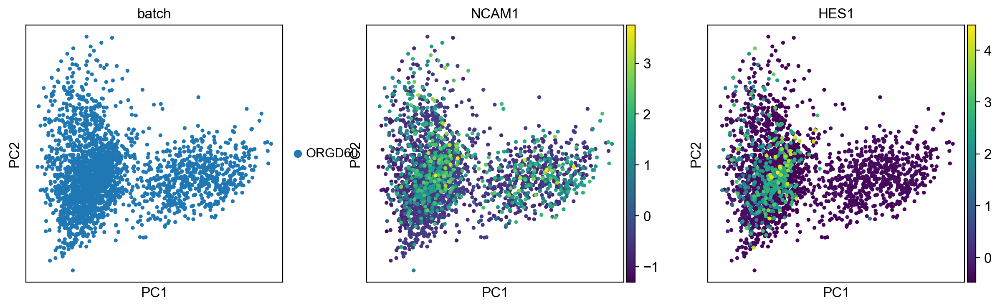

In [69]:
sc.pl.pca(ORGD60, color=['batch', 'NCAM1','HES1'])

In [70]:
sc.pp.neighbors(ORGD60, n_neighbors=20, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [71]:
sc.tl.leiden(ORGD60,resolution=0.3)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [72]:
sc.tl.umap(ORGD60,
#            min_dist = 0.4,
#            spread = 1.0
          )

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


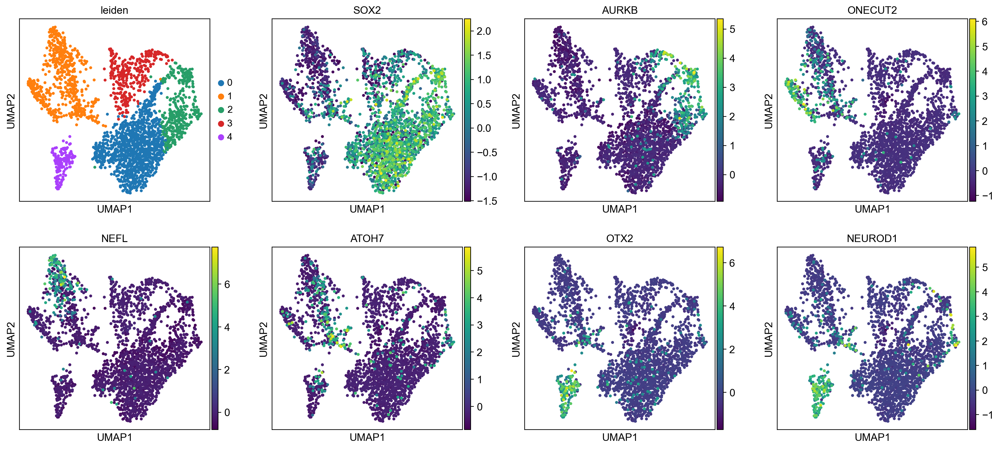

In [73]:
sc.pl.umap(ORGD60, color=['leiden', 'SOX2','AURKB','ONECUT2','NEFL','ATOH7','OTX2','NEUROD1'])

In [74]:
keep_cells=ORGD60.obs["leiden"].str.contains(('^0$|^1$|^2$|^3$|^4$|^5$'), regex=True)

In [75]:
ORGD60 = ORGD60[keep_cells,:]

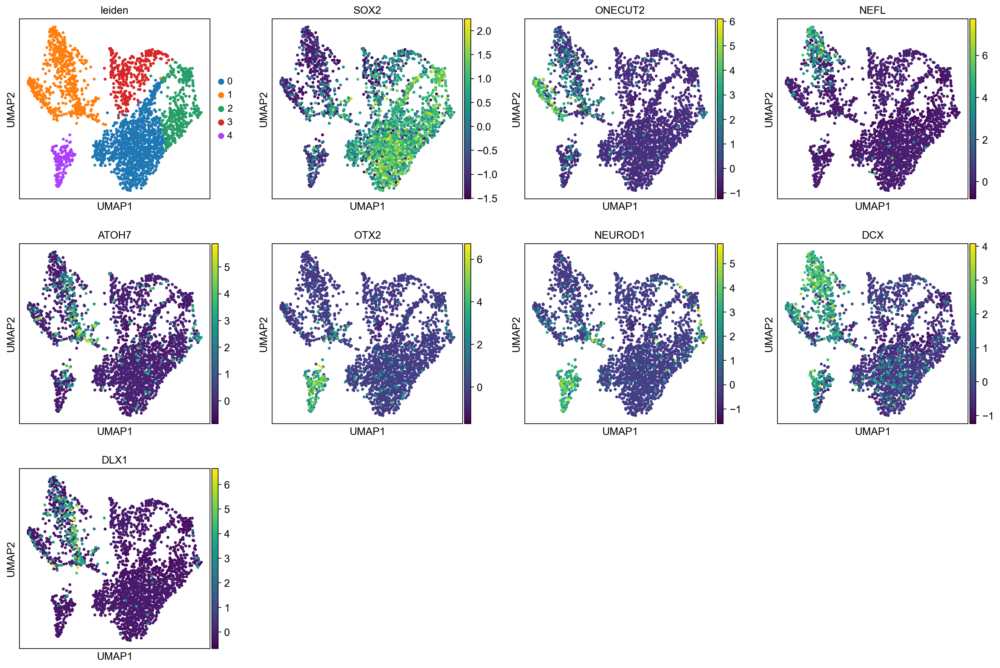

In [76]:
sc.pl.umap(ORGD60, color=['leiden', 'SOX2','ONECUT2','NEFL','ATOH7','OTX2','NEUROD1','DCX','DLX1'])

In [77]:
 # Rename Louvain clusters with ATOH1, ETV2 and NKX3-1
new_cluster_names = ['Prog_O60',
                     'AC/HC/RGC_O60',
                     'CC_O60', 
                     'Prog1_O60', 
                     'PR_O60' # 5  
                    
                    ]
ORGD60.rename_categories('leiden', new_cluster_names)

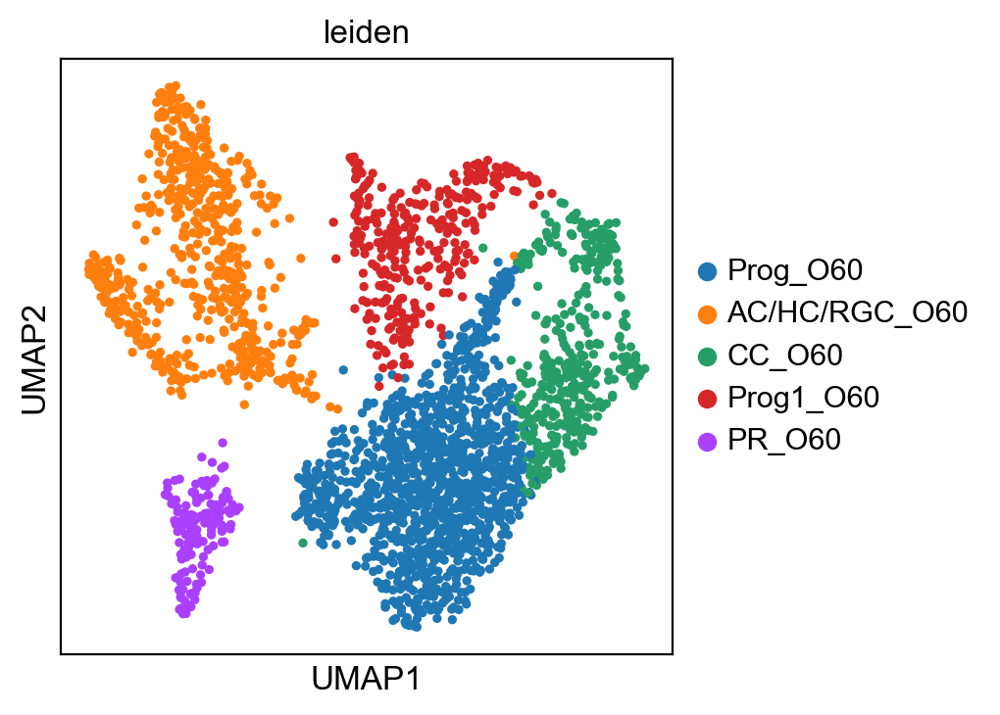

In [80]:
sc.pl.umap(ORGD60, color=['leiden'])

In [83]:
ORGD60.write_h5ad("../count_matrix/GSE142526/ORG_D60b_filtered_feature_bc_matrix/ORGD60_final.h5ad")

In [52]:
optic = sc.read_h5ad("./optic_final_labels.h5ad")

**Integration FD59 to opticCup_day60**

In [84]:
optic = sc.read_h5ad("../count_matrix/d60_optic.h5ad")
FD59 = sc.read_h5ad("../count_matrix/GSE142526/D59_fetal_filtered_gene_bc_matrices/FD59_final.h5ad")
ORGD45 = sc.read_h5ad("../count_matrix/GSE142526/ORG_D45_filtered_feature_bc_matrix/ORGD45_final.h5ad")
ORGD60 = sc.read_h5ad("../count_matrix/GSE142526/ORG_D60b_filtered_feature_bc_matrix/ORGD60_final.h5ad")

In [101]:
adata = FD59.concatenate(ORGD45,ORGD60,optic, batch_categories=['FD59','ORGD45','ORGD60','day60_OpticCups'])

In [102]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=50 )

computing PCA
    with n_comps=50
    finished (0:04:56)


In [103]:
sce.pp.bbknn(adata, n_pcs=50, n_trees=200)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:12)


In [105]:
sc.tl.umap(adata,
#           alpha=1,
#           gamma=1,
#           min_dist=0.3,
#           spread=1.5
          )

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'louvain' as categorical


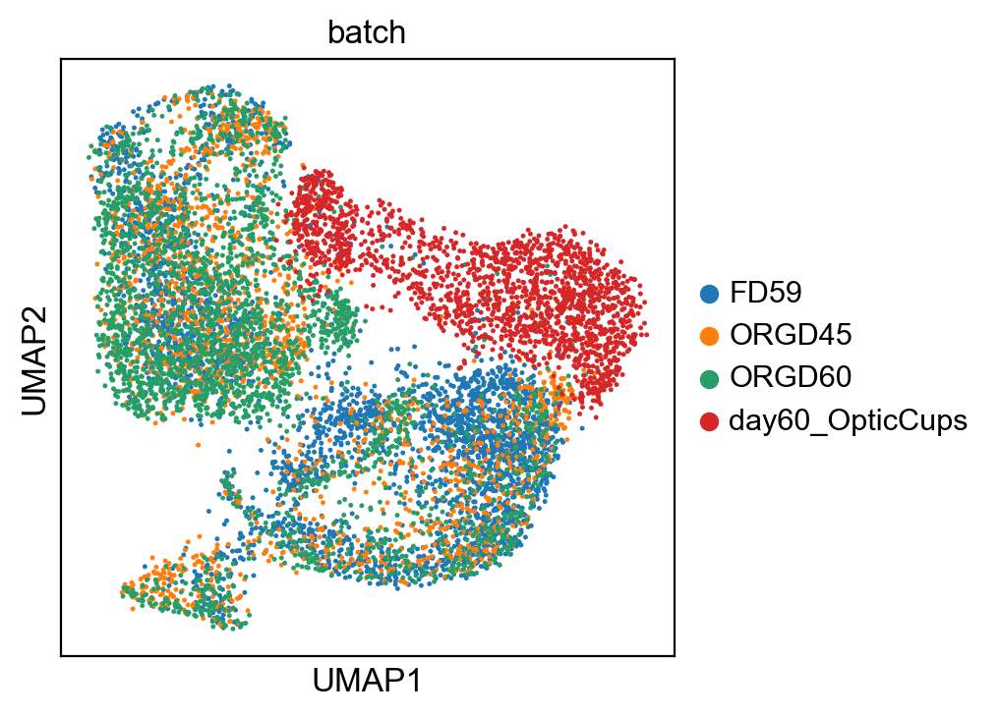

In [106]:

# sc.pl.umap(adata, color=['leiden'])#,'batch'])
sc.pl.umap(adata, color=['batch'])#,'batch'])

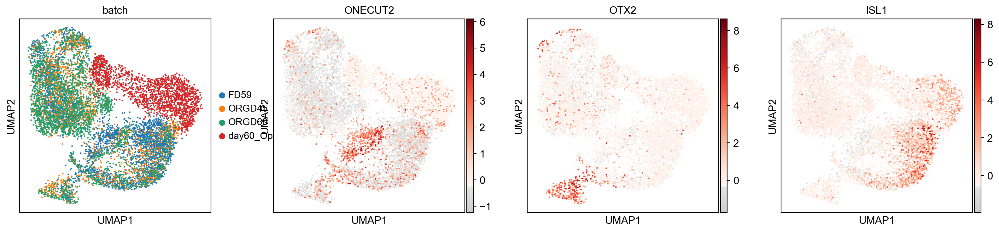

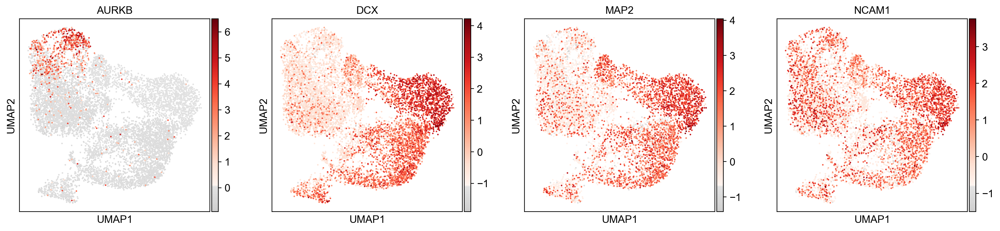

In [107]:
sc.pl.umap(adata, color=['batch','ONECUT2','OTX2','ISL1'],color_map=mymap)#,'batch'])
sc.pl.umap(adata, color=['AURKB','DCX','MAP2','NCAM1'],color_map=mymap)#,'batch'])